#

## Relationship predictor

In [42]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [3]:
divorce_data = pd.read_csv('marriage_divorce_db.csv')
divorce_data.shape
#dataset used - https://www.kaggle.com/datasets/hosseinmousavi/marriage-and-divorce-dataset

(100, 31)

In [4]:
divorce_data

,Age Gap,Education,Economic Similarity,Social Similarities,Cultural Similarities,Social Gap,Common Interests,Religion Compatibility,No of Children from Previous Marriage,Desire to Marry,...,Addiction,Loyalty,Height Ratio,Good Income,Self Confidence,Relation with Non-spouse Before Marriage,Spouse Confirmed by Family,Divorce in the Family of Grade 1,Start Socializing with the Opposite Sex Age,Divorce Probability
0,0.111633,1.915111,10.998678,76.456065,47.847460,50.317656,88.099898,83.738075,4.402822,22.868019,...,3.134119,49.648480,30.822948,94.499164,45.964824,2.032610,1.719332,2.262242,24.356772,2.760190
1,3.355384,2.957842,82.138120,48.656031,30.188517,54.114612,57.020971,98.408133,4.367024,40.336843,...,2.067377,75.220699,68.268221,41.102605,65.387715,1.053402,1.456192,9.795998,19.667152,1.962979
2,6.527365,2.772463,26.337826,59.356238,10.340252,76.595377,80.590985,41.743462,1.197120,45.941845,...,3.599095,22.551866,59.134874,23.053577,84.271897,8.268308,7.095241,9.986173,15.522517,2.858803
3,5.203075,1.729242,66.956033,5.472612,1.003407,55.071435,99.718078,70.493011,3.392041,2.924863,...,1.549274,99.172136,40.984117,43.400040,96.081229,5.852371,6.570749,5.099396,34.665933,1.404621
4,6.864962,4.370290,76.245035,26.797234,93.291581,73.736241,52.896199,11.729729,2.373553,89.851492,...,4.031738,21.629472,89.122381,51.615509,53.330824,9.717223,7.609152,1.294295,22.545763,1.318819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,6.962987,4.290912,8.386214,62.291307,54.683196,96.368597,70.819993,34.046550,4.244249,88.883882,...,3.858440,38.208996,69.785850,4.424765,89.069231,1.310490,4.791609,7.237212,25.947024,1.508494
96,0.782445,3.134205,59.812318,65.977429,75.489836,37.836755,90.947532,21.744616,4.117648,72.646174,...,2.230562,52.062020,36.438678,6.802079,68.304033,1.402042,1.393353,3.153041,36.659010,1.564502
97,4.181422,1.213900,36.880983,66.255955,75.764438,13.180621,84.961868,99.551777,1.404545,91.350428,...,4.513791,21.057973,42.934991,31.621211,87.202084,9.236842,9.636910,6.178748,16.550659,2.645653
98,3.487983,1.658356,74.237358,41.293409,12.489656,94.018496,76.700340,7.633928,3.089036,88.040777,...,1.127180,78.614687,13.793834,76.446395,54.355077,2.529191,4.424587,3.828083,19.358255,1.754198


## Cleaning Data

In [5]:
pd.isnull(divorce_data).any()

Age Gap                                         False
Education                                       False
Economic Similarity                             False
Social Similarities                             False
Cultural Similarities                           False
Social Gap                                      False
Common Interests                                False
Religion Compatibility                          False
No of Children from Previous Marriage           False
Desire to Marry                                 False
Independency                                    False
Relationship with the Spouse Family             False
Trading in                                      False
Engagement Time                                 False
Love                                            False
Commitment                                      False
Mental Health                                   False
The Sense of Having Children                    False
Previous Trading            

In [6]:
divorce_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 31 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   Age Gap                                       100 non-null    float64
 1   Education                                     100 non-null    float64
 2   Economic Similarity                           100 non-null    float64
 3   Social Similarities                           100 non-null    float64
 4   Cultural Similarities                         100 non-null    float64
 5   Social Gap                                    100 non-null    float64
 6   Common Interests                              100 non-null    float64
 7   Religion Compatibility                        100 non-null    float64
 8   No of Children from Previous Marriage         100 non-null    float64
 9   Desire to Marry                               100 non-null    floa

### Finding the correlations

In [38]:
divorce_data['Economic Similarity'].corr(divorce_data['Divorce Probability'])
# price vs room size - correlation

# as the economic similarity increases, divorce probability decreases
# higher the age gap, more the probability of divorce probability
# more social similarities, less probability of divorce
# more independency, more is the probability of divorce, there needs to be a dependency on each other
# relationship with the spouse family is highly important in the relationship
# The sense of having children is very import in the relationship
# Addictions increase the chances of divorce
# Good income decreases the chances of divorce
# the lesser age you start socializing with the opposite sex, higher the probability of divorce, not sure of the meaning out of this fact.





-0.022964690523985597

In [39]:
# Correlating the whole data instead of doing one bye one
# Pearson Correlation Coeffecient
divorce_data.corr()
# correlation of a variable against itself is always equal to one

,Age Gap,Education,Economic Similarity,Social Similarities,Cultural Similarities,Social Gap,Common Interests,Religion Compatibility,No of Children from Previous Marriage,Desire to Marry,...,Addiction,Loyalty,Height Ratio,Good Income,Self Confidence,Relation with Non-spouse Before Marriage,Spouse Confirmed by Family,Divorce in the Family of Grade 1,Start Socializing with the Opposite Sex Age,Divorce Probability
Age Gap,1.000000,0.061491,-0.069285,-0.073104,0.026103,0.033216,-0.240078,-0.158256,-0.152261,-0.029921,...,0.098222,-0.135463,0.014005,0.042613,0.124299,-0.094940,-0.027165,-0.006427,-0.087687,0.097050
Education,0.061491,1.000000,-0.023421,0.163549,0.097599,-0.066602,-0.212029,-0.059199,0.116277,-0.077045,...,-0.080902,0.082321,0.004719,0.026928,0.055594,0.075502,-0.087075,0.008254,-0.018882,-0.317747
Economic Similarity,-0.069285,-0.023421,1.000000,-0.213436,0.004607,-0.125356,0.125657,0.168671,0.091088,0.121203,...,-0.184388,0.095821,-0.053004,0.038303,-0.162643,0.051590,0.022144,-0.065686,-0.018821,-0.022965
Social Similarities,-0.073104,0.163549,-0.213436,1.000000,0.039394,-0.017441,-0.106558,0.094902,-0.009377,-0.103792,...,0.083649,0.178724,-0.073463,0.137842,-0.117248,-0.054796,-0.085585,-0.067553,0.086648,-0.140548
Cultural Similarities,0.026103,0.097599,0.004607,0.039394,1.000000,-0.144952,-0.087997,0.238939,0.036743,0.141688,...,0.039072,-0.060529,0.074546,-0.105851,-0.052490,0.069650,0.118047,-0.103562,0.070187,-0.033238
Social Gap,0.033216,-0.066602,-0.125356,-0.017441,-0.144952,1.000000,0.109405,-0.162396,0.157786,0.051175,...,-0.080146,-0.156922,-0.010343,0.082210,-0.047041,-0.060439,-0.040647,0.226135,0.021973,0.053460
Common Interests,-0.240078,-0.212029,0.125657,-0.106558,-0.087997,0.109405,1.000000,0.077887,0.184563,0.021340,...,-0.109175,-0.061290,0.036092,-0.083011,-0.126595,0.106027,0.097683,-0.028218,0.154278,-0.045570
Religion Compatibility,-0.158256,-0.059199,0.168671,0.094902,0.238939,-0.162396,0.077887,1.000000,0.003106,0.034559,...,0.021099,-0.009621,-0.101136,-0.040194,0.214238,-0.011940,0.202111,0.076897,0.118677,-0.033775
No of Children from Previous Marriage,-0.152261,0.116277,0.091088,-0.009377,0.036743,0.157786,0.184563,0.003106,1.000000,-0.038050,...,-0.077000,-0.057955,0.045219,-0.083007,-0.180908,0.124530,-0.092507,0.009299,0.141925,-0.020490
Desire to Marry,-0.029921,-0.077045,0.121203,-0.103792,0.141688,0.051175,0.021340,0.034559,-0.038050,1.000000,...,-0.035211,-0.118220,0.072562,-0.045443,-0.059712,0.113234,0.068695,-0.046633,-0.169814,-0.088105


In [40]:
mask = np.zeros_like(divorce_data.corr())
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices] = True
# removing the duplicates

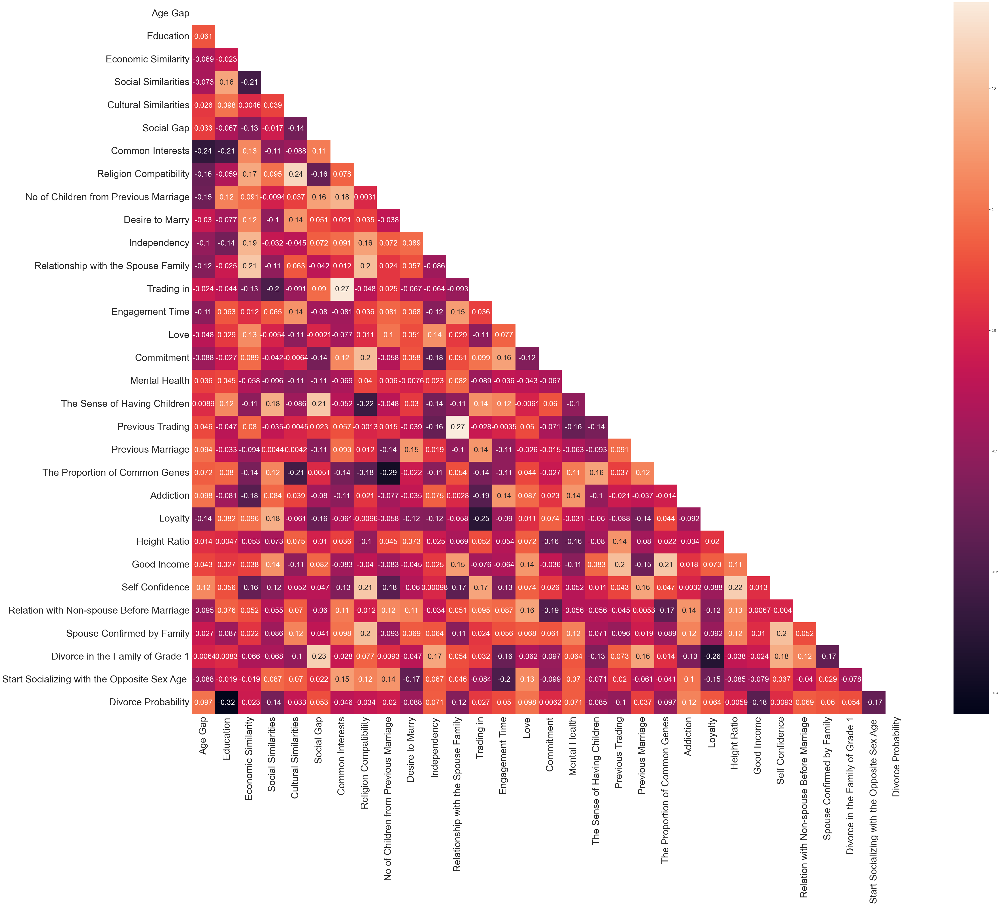

In [55]:
# Correlation Matrix
plt.figure(figsize = (50,40))
sns.heatmap(divorce_data.corr(), mask = mask, annot = True, annot_kws={"size": 23})
sns.set_style('white')
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()


# Finding meaning out of the below heatmap, most impactful insights
# More educated you are, more income you have, less addictions you have, better relationship you have with spouse's family - less probability of divorce.
# More the age gap, lesser the common interest, lesser the engagement time.
# More educated you are, lesser common interests ? Not sure what I understand.
# The desire to marry increases with economic similarities and cultural similarities
# Relationship with spouse's family decreases with high age gap, increases with increase with economic similarity.
# More common interests you have, high religion compatibility, more engagement time, more commited you are.
# Speaking about loyality - higer the age less, less the loyality. Increases with social similarities, Increases with less social gap, Increases with engagement time, Decreases with previous marriage.
# Relationship with non spouse before marriage - translates to lesser commitment, but I do see an increase in love ?

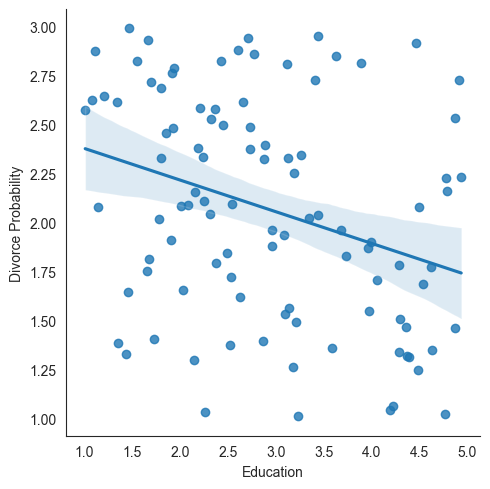

In [63]:
# Challenge: create a regression plot between the house prices and the number of rooms (RM)
# Seaborn builds on top of matplotlib - like matplot on steriods
# set is used to reset the styling to default
sns.lmplot(x='Education', y='Divorce Probability', data = divorce_data)
plt.show()

In [65]:
%%time
sns.pairplot(divorce_data, kind = 'reg', plot_kws={'line_kws': {'color': 'cyan'}})
# scatter is default
plt.show()

Wall time: 4min 22s
